# Insurance Data Analysis

## Statistical Modeling


### Importing necessary libraries

In [1]:
import sys
import os

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler

from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor

import lime.lime_tabular
import shap
shap.initjs()

In [2]:
import warnings
warnings.filterwarnings('ignore', category=UserWarning)


In [3]:
sys.path.append(os.path.abspath('../scripts'))
from Modelling_testing import Modelling 

In [4]:
data = pd.read_csv('../data/dataset.csv', low_memory=False)

In [5]:
modelling = Modelling(data)

#### For each postalCode, a linear regression model that predicts the total claims


##### Data Preparation

In [6]:
features = [
    'IsVATRegistered',
    'Citizenship',
    'LegalType',
    'PostalCode',
    'TotalPremium',
    'AccountType', 'Gender','Country', 'Province','AlarmImmobiliser',
    'MainCrestaZone', 'SubCrestaZone', 'cubiccapacity', 'kilowatts',
    'TrackingDevice', 'CapitalOutstanding', 'NewVehicle',
    'SumInsured', 'TermFrequency',
    'ExcessSelected', 'CoverCategory', 'CoverType', 'CoverGroup', 'Section', 'Product',
    'VehicleType', 'RegistrationYear',
    'Cylinders'
]

X = data[features]
y = data['TotalClaims']

X = pd.get_dummies(X, columns=['Citizenship', 'LegalType', 'IsVATRegistered',
                               'AccountType', 'Gender','Country', 'Province','MainCrestaZone',
                               'SubCrestaZone', 'TermFrequency', 'ExcessSelected','CoverCategory',
                               'CoverType', 'CoverGroup', 'Section', 'Product',
                               'VehicleType'], drop_first=True)



X_train, X_test, y_train, y_test = modelling.split_data(X, y)

##### Model Building

In [7]:
model = LinearRegression()
model.fit(X_train, y_train) 

print('Training the model completed')


Training the model completed


##### Model Evaluation


In [8]:
modelling.model_testing(model, X_test, y_test)

Mean Absolute Error (MAE): 153.94549106456304
Mean Squared Error (MSE): 5192102.192068448
Root Mean Squared Error (RMSE): 2278.6184832192616
R-squared: 0.008316369136253665


In [9]:
coefficients = model.coef_
feature_names = X.columns

importance_df = pd.DataFrame({
    'Feature': feature_names,
    'Coefficient': coefficients
})

importance_df['Absolute Coefficient'] = importance_df['Coefficient'].abs()

importance_df.sort_values(by='Absolute Coefficient', ascending=False).head(10)

# importance_df = importance_df.sort_values(by='Absolute Coefficient', ascending=False)
# plt.figure(figsize=(50, 38))
# plt.barh(importance_df['Feature'], importance_df['Absolute Coefficient'])
# plt.xlabel('Absolute Coefficient Value')
# plt.title('Feature Importance for Linear Regression')
# plt.tight_layout()
# plt.show()

,Feature,Coefficient,Absolute Coefficient
112,CoverCategory_Factory Fitted Sound and Other E...,3009.097573,3009.097573
138,CoverType_Factory Fitted Sound and Other Elect...,3009.097573,3009.097573
98,ExcessSelected_Mobility - Taxi with value more...,-1148.433292,1148.433292
139,CoverType_Fire and Theft,-770.996946,770.996946
102,ExcessSelected_No excess,-739.620590,739.620590
95,ExcessSelected_Mobility - Taxi with value more...,615.810208,615.810208
142,CoverType_Own Damage,-514.497998,514.497998
150,CoverType_Windscreen,-495.513756,495.513756
97,ExcessSelected_Mobility - Taxi with value more...,-409.773009,409.773009
118,CoverCategory_Own damage,-380.031131,380.031131


In [10]:
# Useful features extracted from the table and graph above
features_from_graph = [
    'ExcessSelected',  'CoverType', 'CoverCategory', 'MainCrestaZone',
    'Product', 'LegalType'
]


**Observation**
- Linear regression is not the right model to predict the total claim but we can use the graph to extract addional features that were important to the model and use it in other models.

#### Model that predicts optimal premium values 

##### Data Preparation

In [11]:
car_features = ['ExcessSelected', 'VehicleType', 'Model', 'RegistrationYear', 'Cylinders', 'cubiccapacity',
                'kilowatts']
owner_features = ['Citizenship', 'PostalCode', 'Gender']
location_features = ['Province', 'MainCrestaZone']
other_features = ['IsVATRegistered', 'CoverType','CoverCategory','SumInsured']

features = car_features + owner_features + location_features + other_features

X = data[features]
y = data['TotalPremium']  


X = pd.get_dummies(X, columns=['VehicleType', 'Model', 'Citizenship', 'Province', 'Gender', 
                                'ExcessSelected', 'CoverType', 'CoverCategory', 'MainCrestaZone'], drop_first=True)

X_train, X_test, y_train, y_test = modelling.split_data(X, y)


##### Model Building

In [12]:
linear = LinearRegression()
linear.fit(X_train, y_train)

dTree = DecisionTreeRegressor(random_state=42)
dTree.fit(X_train, y_train)

rForest = RandomForestRegressor(n_estimators=50, max_depth=5,min_samples_split=10, 
                               min_samples_leaf=6, n_jobs=-1, random_state=42)
rForest.fit(X_train, y_train)

xgb = XGBRegressor(random_state=42)
xgb.fit(X_train, y_train)

print('Training models completed')

Training models completed


##### Model Evaluation


In [13]:
for model in [linear, dTree, xgb, rForest]:

    if model == linear:
        print(">>>>>>>>>>>>>> Linear Regression Model<<<<<<<<<<<<<<<<<<")
    
    elif model == dTree:
        print(">>>>>>>>>>>>>> Decision Tree Model<<<<<<<<<<<<<<<<<<")

    elif model == xgb:
        print(">>>>>>>>>>>>>> XGBoost Model<<<<<<<<<<<<<<<<<<")

    elif model == rForest:
        print(">>>>>>>>>>>>>> Random Forest Regressor Model<<<<<<<<<<<<<<<<<<")    


    modelling.model_testing(model, X_test, y_test)

    print('\n\n\n')


>>>>>>>>>>>>>> Linear Regression Model<<<<<<<<<<<<<<<<<<
Mean Absolute Error (MAE): 55.15250690416106
Mean Squared Error (MSE): 12280.522151498895
Root Mean Squared Error (RMSE): 110.81751734946464
R-squared: 0.5008887356586995




>>>>>>>>>>>>>> Decision Tree Model<<<<<<<<<<<<<<<<<<
Mean Absolute Error (MAE): 27.0992124093745
Mean Squared Error (MSE): 6169.827227284221
Root Mean Squared Error (RMSE): 78.54824776711585
R-squared: 0.7492427251717999




>>>>>>>>>>>>>> XGBoost Model<<<<<<<<<<<<<<<<<<
Mean Absolute Error (MAE): 44.585826819226604
Mean Squared Error (MSE): 9742.376508024376
Root Mean Squared Error (RMSE): 98.70347768961526
R-squared: 0.6040453494873965




>>>>>>>>>>>>>> Random Forest Regressor Model<<<<<<<<<<<<<<<<<<
Mean Absolute Error (MAE): 48.79528397309428
Mean Squared Error (MSE): 11361.670349865712
Root Mean Squared Error (RMSE): 106.59113635694908
R-squared: 0.538233180691067






**Observation**
- As we can see Decision tree performed better compared to the other models

### Feature importance using Lime for all the models

In [14]:
explainer = lime.lime_tabular.LimeTabularExplainer(np.array(X_train), feature_names=X_train.columns, 
                                                   verbose=True, mode='regression')



In [15]:
instance = X_test.iloc[0].values

exp = explainer.explain_instance(instance, linear.predict, num_features=5)

exp.show_in_notebook()

Intercept -49.49665668780087
Prediction_local [154.11635532]
Right: 396.13031777342803


**Observation**
- The prediction for this instance is strongly influenced by the feature CoverType_Own Damage, which positively affects the outcome.
- Conversely, the feature Model_50 C15V 15 F/C P/V contributes negatively, significantly impacting the predicted value.
- The varying contributions from the Model_QUANTUM 2.7 SESFIKILE features suggest that they may have nuanced effects on the prediction based on their specific values.

In [16]:
instance = X_test.iloc[0].values

exp = explainer.explain_instance(instance, dTree.predict, num_features=5)

exp.show_in_notebook()

Intercept 596.3243816117946
Prediction_local [162.18004303]
Right: 0.0


**Ovservation**
- The model predicts a value of approximately 198.90 for this instance.
- The feature CoverType_Own Damage contributes positively to this prediction, suggesting that having this coverage type is associated with higher predicted premiums.
- Conversely, Model_320i (E36) has a negative effect on the prediction, indicating that this model type is associated with lower premiums.

In [17]:
instance = X_test.iloc[0].values

exp = explainer.explain_instance(instance, rForest.predict, num_features=5)

exp.show_in_notebook()

Intercept 193.79987132921104
Prediction_local [283.21024487]
Right: 485.1994825324486


In [18]:
instance = X_test.iloc[0].values

exp = explainer.explain_instance(instance, xgb.predict, num_features=5)

exp.show_in_notebook()

Intercept 246.29978997324787
Prediction_local [287.21444627]
Right: 425.9976


**Observation**
- The prediction for this instance is heavily influenced by the feature CoverType_Own Damage, which contributes positively and significantly to the predicted outcome.
- The presence of other features has minimal impact on the prediction in this case, as indicated by their low contributions.
- This analysis provides insights into which features are most important for the specific prediction.

### Feature Importance using SHAP: for XGBoost model

In [21]:
explainer_sharp = shap.Explainer(xgb)
shap_values = explainer_sharp(X_test)
 

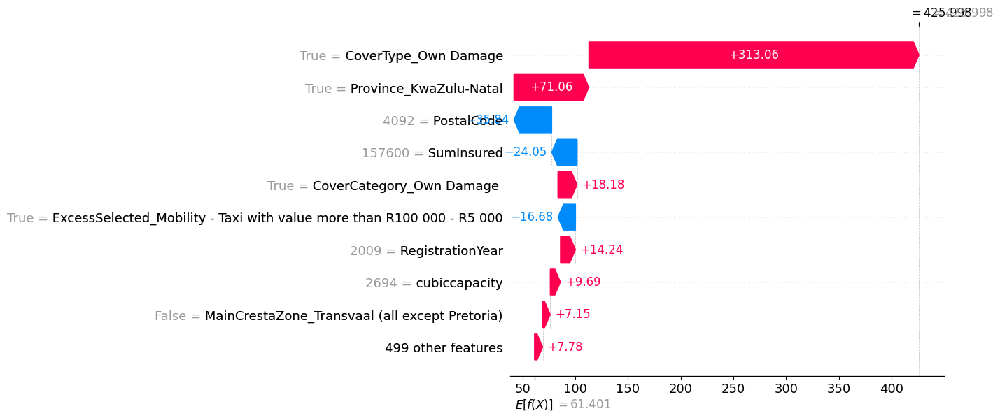

In [22]:
# Waterfall plot for the first observation
shap.waterfall_plot(shap_values[0])

**Observation**
- The waterfall plot effectively illustrates how different features balance each other to determine the final prediction.
- Features with large positive contributions suggest that they strongly influence the model towards higher predictions, while negative contributors indicate features that pull the prediction down.
- This visualization helps in understanding model behavior, identifying influential features, and explaining predictions

In [23]:
shap.plots.force(shap_values[0])

In [24]:
shap.plots.force(shap_values[0:100])

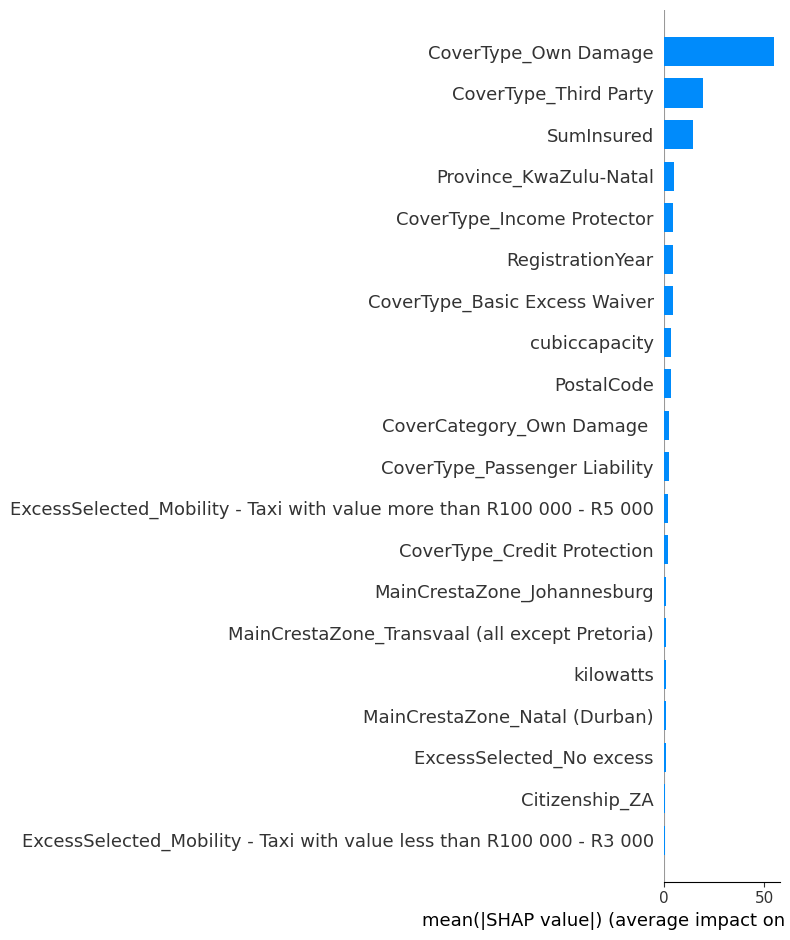

In [25]:
shap.summary_plot(shap_values, X_test, plot_type="bar")

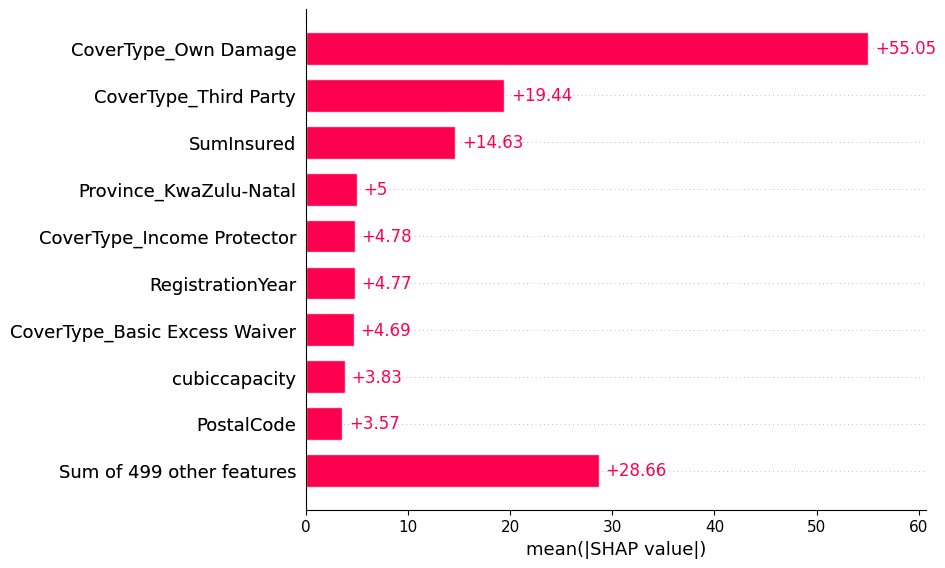

In [26]:
shap.plots.bar(shap_values)

**Observation**
- Features with a high average impact should be examined closely, as they can provide insights into the underlying data patterns and relationships.

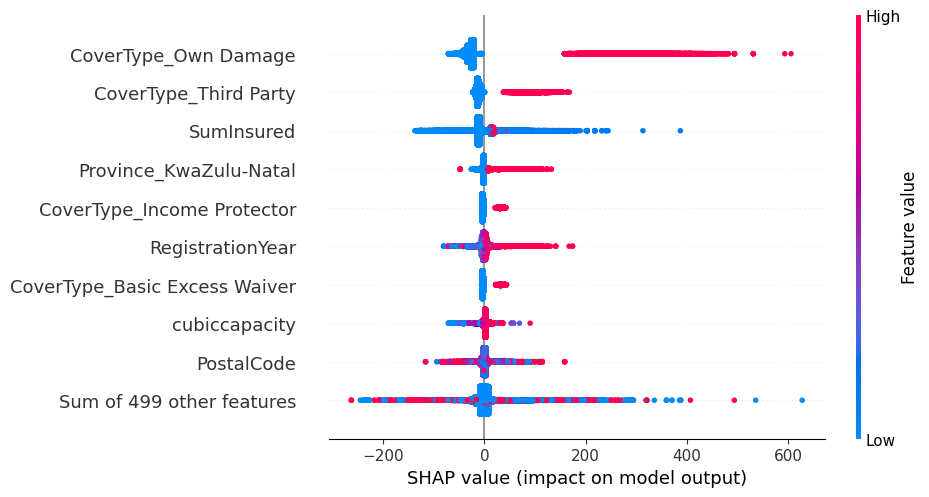

In [27]:
shap.plots.beeswarm(shap_values)

**Observation**
- The x-axis represents the SHAP values, which indicate the impact of each feature on the model output. Positive SHAP values push the prediction higher, while negative values pull it lower.
- The y-axis lists the features in order of their importance, typically with the most impactful features at the top.
- The color scale (from blue to red) represents the feature value:
    - Red indicates higher values of the feature.
    - Blue indicates lower values of the feature.


- `CoverType_Own Damage`: This feature has a significant positive impact on predictions, with many instances pushing predictions higher.
- `CoverType_Third Party` also shows a notable impact, with both high and low values affecting predictions across various instances.
- `SumInsured`: This feature appears to have a mixed impact, with some values leading to higher predictions and others resulting in lower predictions.
- Features like `cubiccapacity` and `PostalCode` show a narrower range of impact, suggesting they may have less influence on the model compared to the top features.